In [1]:
from detectron2.structures import BoxMode
import random
import cv2
import json
import os
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import Visualizer
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2 import model_zoo
import numpy as np
import torch
import torchvision
import detectron2
from detectron2.utils.logger import setup_logger
from omegaconf import OmegaConf
from tqdm.auto import tqdm
import pandas as pd

In [11]:
def get_dataset_dicts(config_dir):

    df = pd.read_csv(config_dir)

    class_mapper = np.load('./dataset/trainval_classes.npy', allow_pickle=True)
    dataset_dicts = []
    
    for idx, row in tqdm(df.iterrows(), total=len(df)):
        if idx < 30000:
            continue
        if idx == 31300:
            break
            
        record = {}
        #config = OmegaConf.load(row.yaml_path)
        filename = row.image_path
        height, width = 480, 640

        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        objs = []
        x1 = row.bbox_x1
        y1 = row.bbox_y1
        x2 = row.bbox_x2
        y2 = row.bbox_y2

        obj = {
            "bbox": [x1, y1, x2, y2],
            "bbox_mode": BoxMode.XYXY_ABS,
            "category_id": np.where(class_mapper == row['class'])[0][0],
        }
        objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [3]:
# for d in ["train", "val"]:
thing_classes = np.load('./dataset/trainval_classes.npy', allow_pickle=True)
for d in ["test"]:
    DatasetCatalog.register(
        "aihub_" + d, lambda d=d: get_dataset_dicts(f"dataset/{d}_dataframe.csv"))
    MetadataCatalog.get("aihub_" + d).set(thing_classes=thing_classes)

aihub_metadata = MetadataCatalog.get("aihub_test")

In [4]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(
    "COCO-Detection/retinanet_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("aihub_val",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 8
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-Detection/retinanet_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0001
cfg.SOLVER.MAX_ITER = 3000000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 32
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1031

# RetinaNet
cfg.MODEL.RETINANET.NUM_CLASSES = 1031
cfg.MODEL.RETINANET.IN_FEATURES = ["p3", "p4", "p5", "p6", "p7"]
cfg.MODEL.RETINANET.NUM_CONVS = 4
cfg.MODEL.RETINANET.IOU_THRESHOLDS = [0.4, 0.5]
cfg.MODEL.RETINANET.IOU_LABELS = [0, -1, 1]
cfg.MODEL.RETINANET.PRIOR_PROB = 0.01
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.05
cfg.MODEL.RETINANET.TOPK_CANDIDATES_TEST = 1000
cfg.MODEL.RETINANET.NMS_THRESH_TEST = 0.5

# Weights on (dx, dy, dw, dh) for normalizing Retinanet anchor regression targets
cfg.MODEL.RETINANET.BBOX_REG_WEIGHTS = (1.0, 1.0, 1.0, 1.0)

# Loss parameters
cfg.MODEL.RETINANET.FOCAL_LOSS_GAMMA = 2.0
cfg.MODEL.RETINANET.FOCAL_LOSS_ALPHA = 0.25
cfg.MODEL.RETINANET.SMOOTH_L1_LOSS_BETA = 0.1
# Options are: "smooth_l1", "giou"
cfg.MODEL.RETINANET.BBOX_REG_LOSS_TYPE = "smooth_l1"

# One of BN, SyncBN, FrozenBN, GN
# Only supports GN until unshared norm is implemented
cfg.MODEL.RETINANET.NORM = ""

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_0184999.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85   # set a custom testing threshold
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.25
cfg.MODEL.DEVICE='cpu'
predictor = DefaultPredictor(cfg)

Loading config /home/ubuntu/anaconda3/envs/py36aihub/lib/python3.6/site-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


In [12]:
from detectron2.utils.visualizer import ColorMode
import matplotlib.pyplot as plt
plt.figure(figsize=(10,10))

dataset_dicts = get_dataset_dicts(f"dataset/test_dataframe.csv")

<Figure size 720x720 with 0 Axes>

PRED: ['선정전' '인정문' '선정전' '대조전' '선정전']
Score:  tensor([0.6352, 0.3198, 0.3104, 0.2589, 0.2512])
LABEL: 선정전


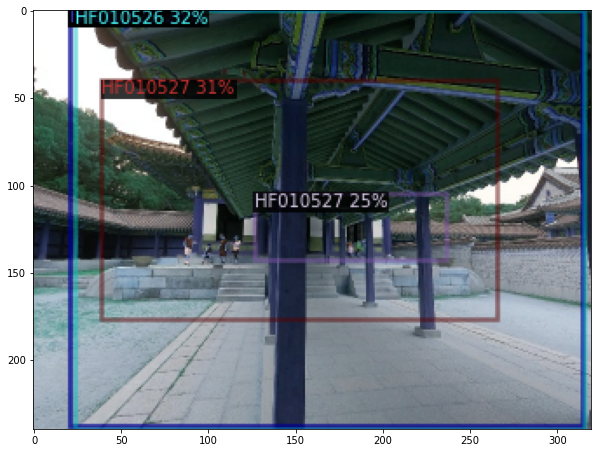

PRED: ['전홍유후설총묘' '경주서악동고분군' '미추왕릉' '진평왕릉' '전홍유후설총묘']
Score:  tensor([0.4862, 0.4095, 0.3086, 0.3058, 0.2610])
LABEL: 경주서악동고분군


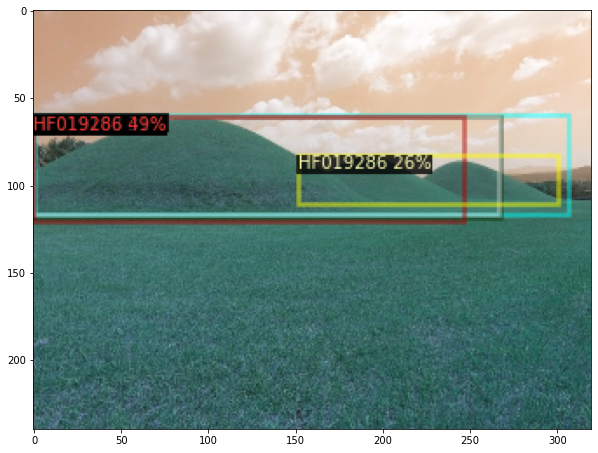

PRED: ['강화동종' '성덕대왕신종' '공화춘']
Score:  tensor([0.9261, 0.2911, 0.2537])
LABEL: 강화동종


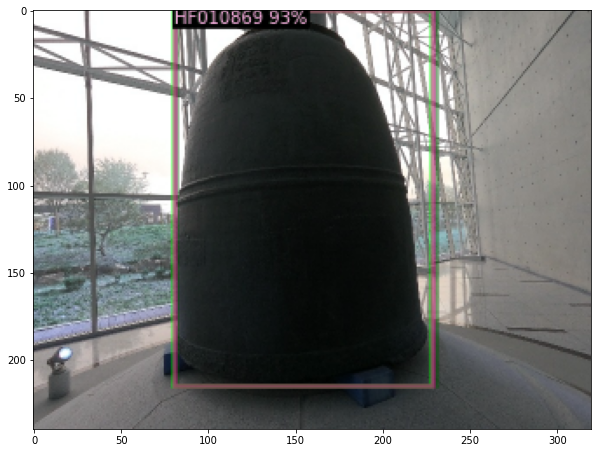

PRED: ['삼암돈대' '굴암돈대' '포천반월성' '별망성지' '장곶돈대' '진지왕릉' '관문성' '분오리돈대']
Score:  tensor([0.7111, 0.5998, 0.4782, 0.3788, 0.2790, 0.2770, 0.2745, 0.2503])
LABEL: 삼암돈대


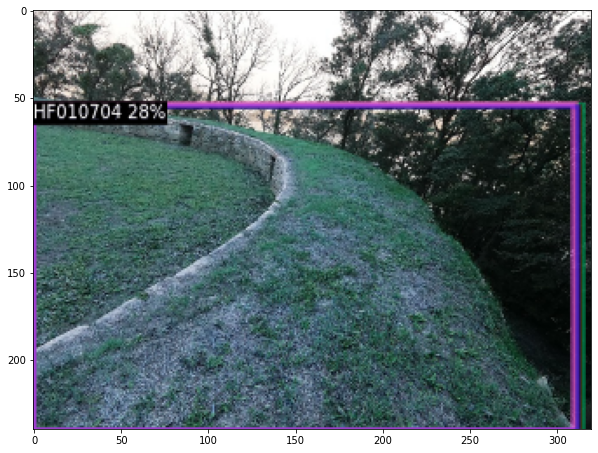

PRED: 구김포성당
Score:  tensor([0.8607])
LABEL: 구김포성당


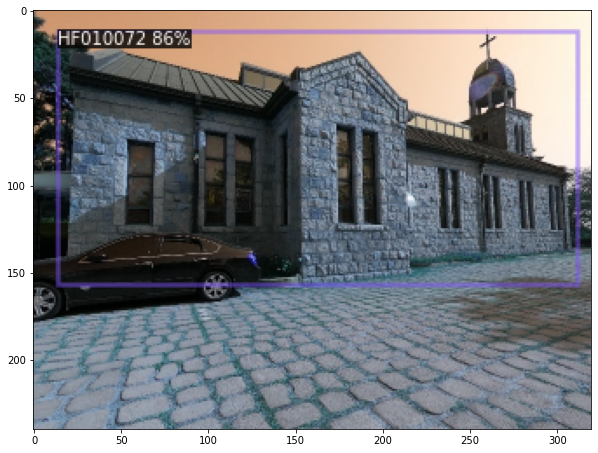

PRED: ['한재당' '유연정']
Score:  tensor([0.3326, 0.2731])
LABEL: 황희선생영당지


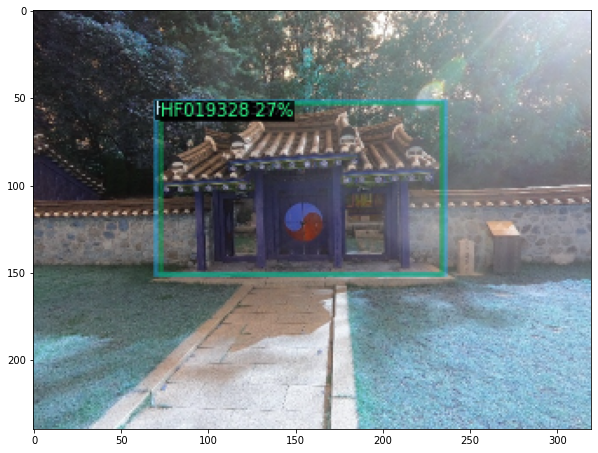

PRED: ['포천반월성' '사천왕사지' '후애돈대' '굴암돈대' '경주남산탑곡마애불상군']
Score:  tensor([0.5894, 0.3592, 0.3016, 0.2887, 0.2780])
LABEL: 포천반월성


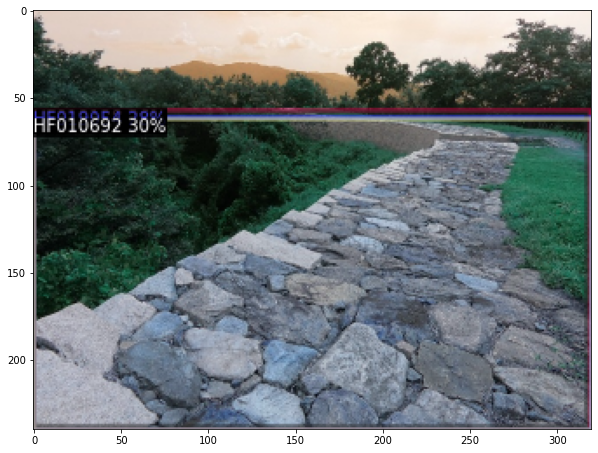

PRED: ['강화전성' '강화외성' '롯데시티호텔제주']
Score:  tensor([0.8568, 0.5136, 0.3034])
LABEL: 강화전성


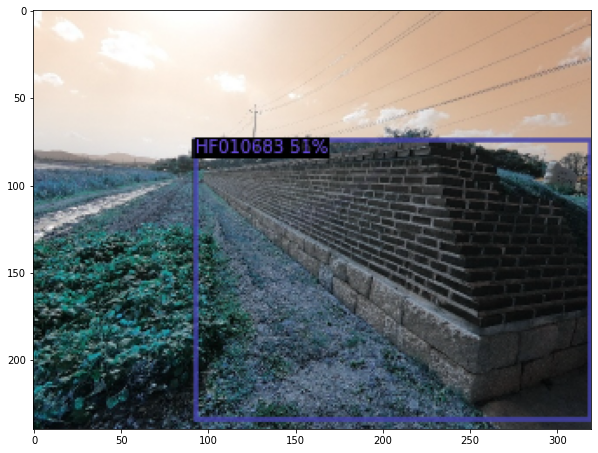

PRED: ['본관' '구수원문화원' '본관' '서관' '최규하가옥']
Score:  tensor([0.3767, 0.3530, 0.3270, 0.2638, 0.2551])
LABEL: 구수원문화원


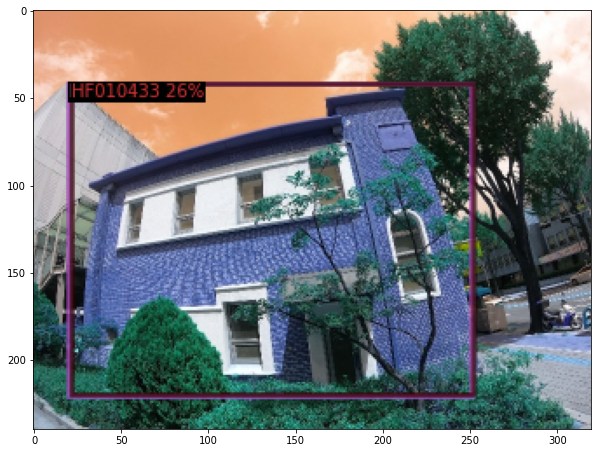

PRED: 석수문
Score:  tensor([0.9156])
LABEL: 석수문


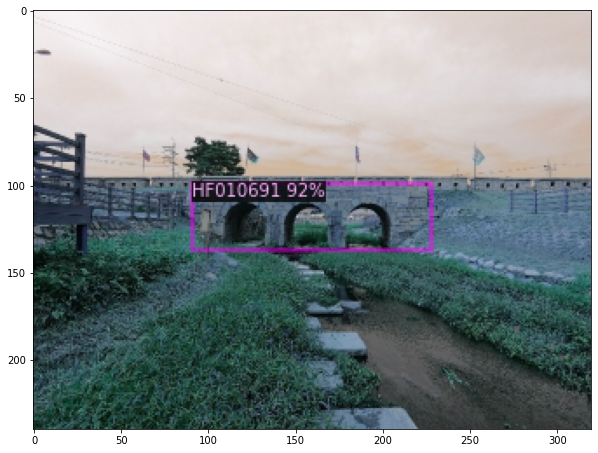

PRED: ['완남부원군이후원묘역' '이익선생묘' '전주이씨안양군묘' '송석최명창묘역' '민영환선생묘']
Score:  tensor([0.4548, 0.2947, 0.2889, 0.2776, 0.2634])
LABEL: 완남부원군이후원묘역


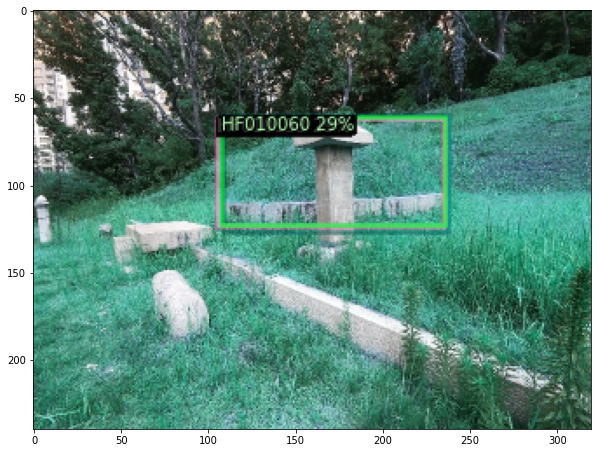

PRED: ['영지석불좌상' '남계원지칠층석탑' '인평대군치제문비']
Score:  tensor([0.9370, 0.4354, 0.3251])
LABEL: 영지석불좌상


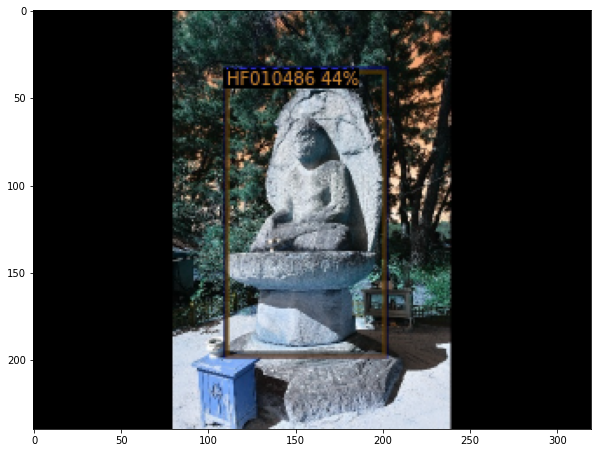

PRED: ['십삼층석탑' '남계원지칠층석탑']
Score:  tensor([0.9554, 0.7042])
LABEL: 십삼층석탑


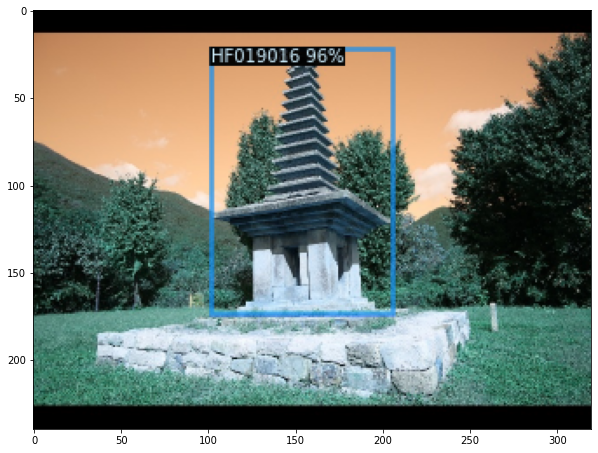

PRED: ['엑스포타워' '첨성대']
Score:  tensor([0.8487, 0.2625])
LABEL: 엑스포타워


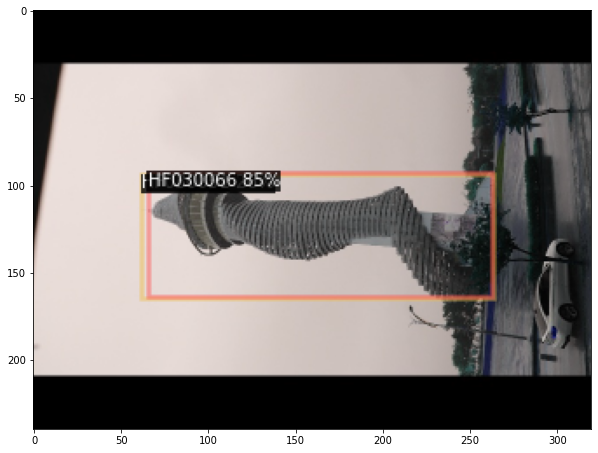

PRED: ['농성' '효소왕릉']
Score:  tensor([0.2925, 0.2602])
LABEL: 경주석빙고


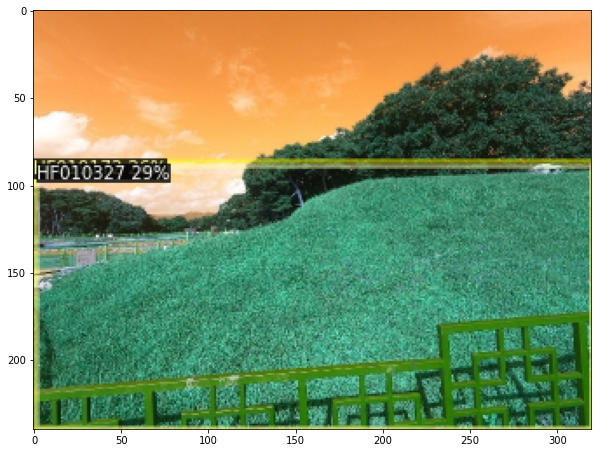

PRED: 이항복선생묘
Score:  tensor([0.4043])
LABEL: 이항복선생묘


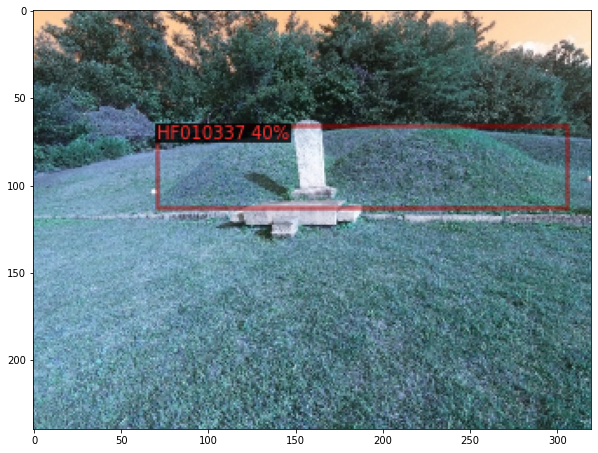

PRED: ['허난설헌묘' '망덕사지' '연천학곡리고인돌']
Score:  tensor([0.7770, 0.2773, 0.2629])
LABEL: 허난설헌묘


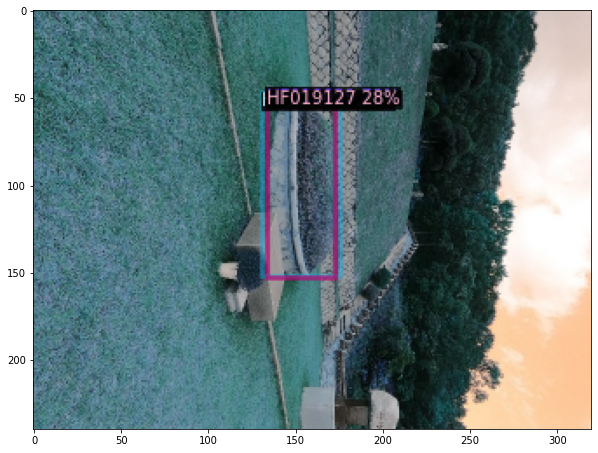

PRED: 답동성당
Score:  tensor([0.8627])
LABEL: 답동성당


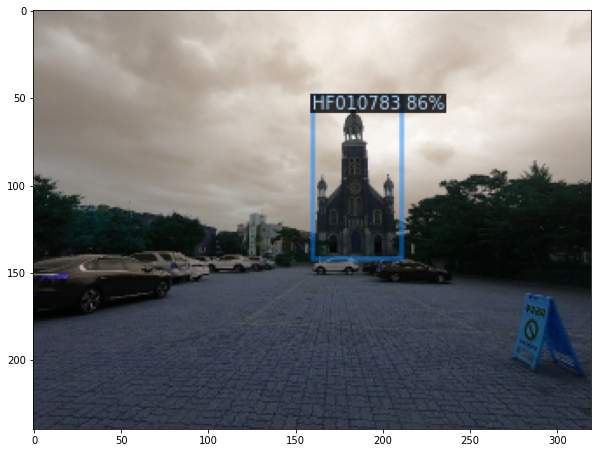

PRED: ['경주알천제방수개기' '연천학곡리적석총']
Score:  tensor([0.7032, 0.2762])
LABEL: 경주알천제방수개기


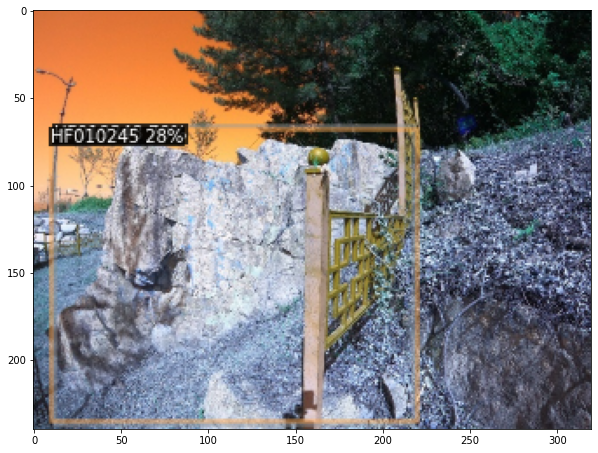

PRED: ['허유전묘' '조서강묘' '경순왕릉' '덕봉정사' '효간공이정영묘역' '정강왕릉']
Score:  tensor([0.8350, 0.4648, 0.4220, 0.3703, 0.3197, 0.2638])
LABEL: 허유전묘


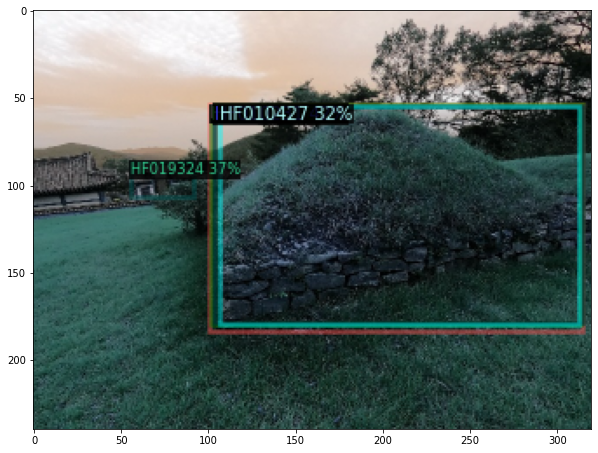

PRED: ['홍릉' '이수광선생묘' '강화능내리석실분' '정발장군묘' '이경석선생묘']
Score:  tensor([0.8835, 0.5294, 0.3607, 0.3172, 0.3141])
LABEL: 홍릉


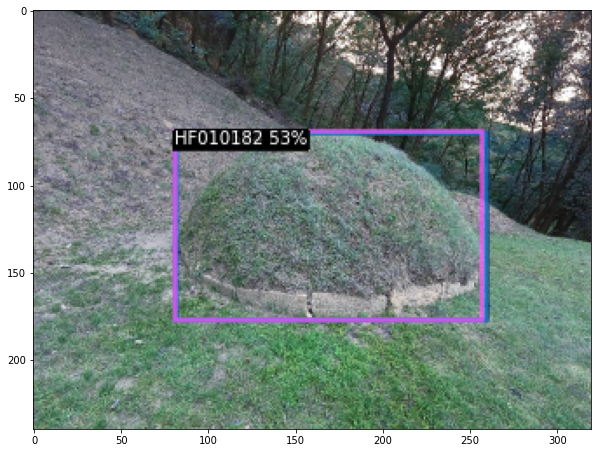

PRED: ['갑곶돈' '망양돈대' '갑곶돈']
Score:  tensor([0.7659, 0.4125, 0.3245])
LABEL: 갑곶돈


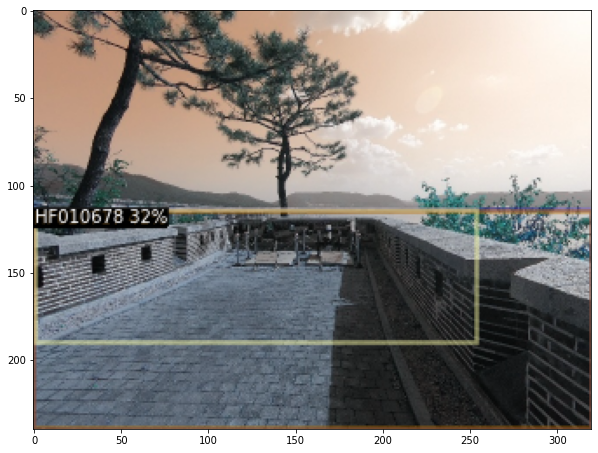

PRED: ['극락보전' '명부전' '대웅전' '극락보전' '판전' '전등사철종']
Score:  tensor([0.6081, 0.4722, 0.3097, 0.2831, 0.2706, 0.2555])
LABEL: 명부전


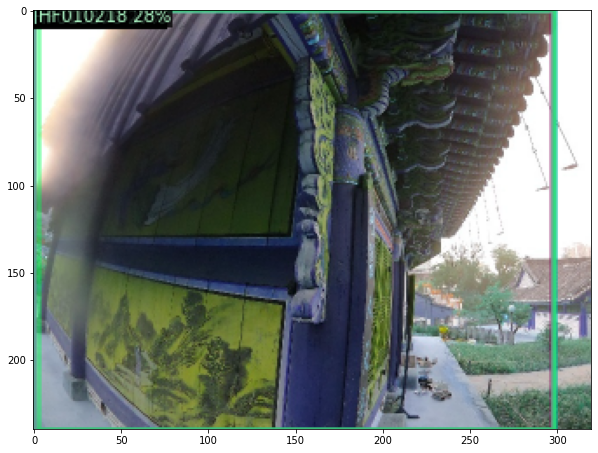

PRED: []
Score:  tensor([])
LABEL: 이익선생묘


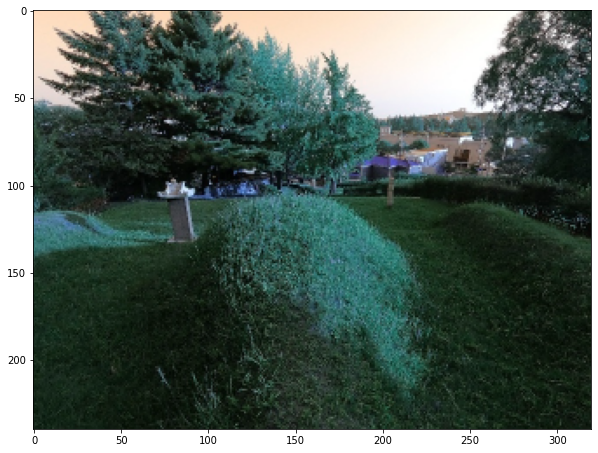

PRED: ['이방청' '이방청']
Score:  tensor([0.8205, 0.5925])
LABEL: 이방청


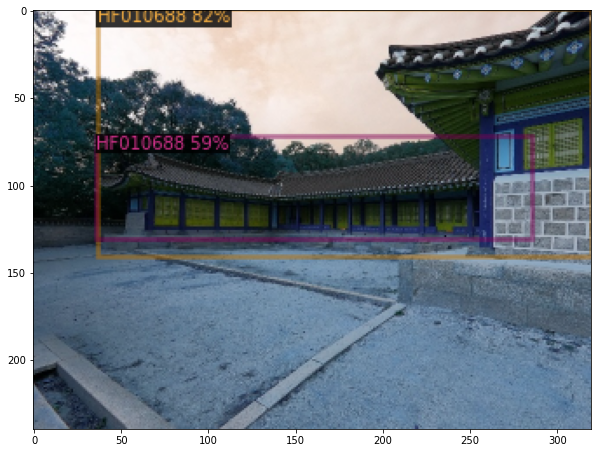

PRED: ['구일본제18은행지점' '구일본제58은행지점' '강화온수리성공회성당' '서흥김씨삼강정문' '구일본제18은행지점' '구대법원청사'
 '구러시아공사관' '내동성공회성당']
Score:  tensor([0.9065, 0.5028, 0.3336, 0.3158, 0.3003, 0.2957, 0.2872, 0.2684])
LABEL: 구일본제18은행지점


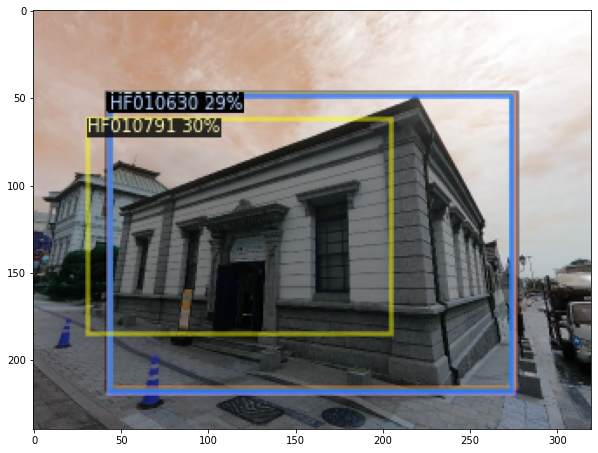

PRED: 근정전
Score:  tensor([0.8730])
LABEL: 근정전


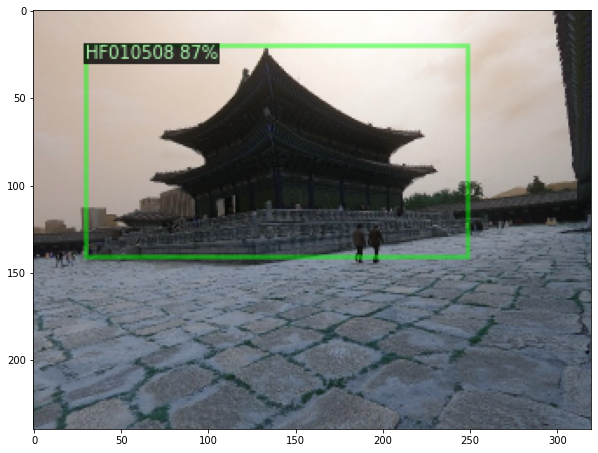

PRED: ['고선사지삼층석탑' '프라이부르크전망대' '창림사지삼층석탑' '경주천군동사지' '남계원지칠층석탑' '경주장항리서오층석탑'
 '봉림사지진경대사탑' '정부세종켄벤션센터']
Score:  tensor([0.7568, 0.5050, 0.4779, 0.3823, 0.3129, 0.2994, 0.2785, 0.2660])
LABEL: 고선사지삼층석탑


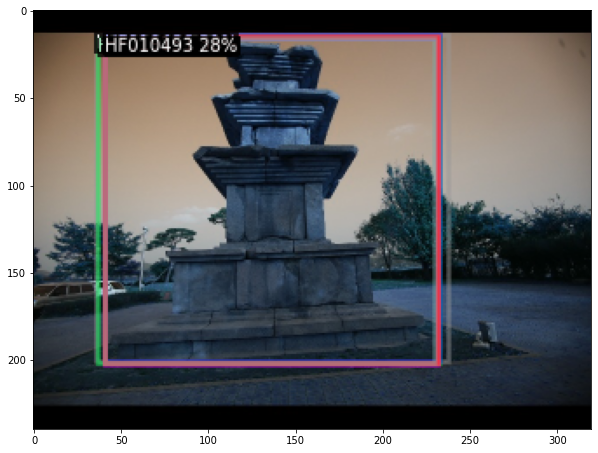

PRED: ['오산금암리지석묘군' '강화대산리지석묘' '오산금암리지석묘군' '연천차탄리고인돌']
Score:  tensor([0.3293, 0.2784, 0.2640, 0.2575])
LABEL: 오산금암리지석묘군


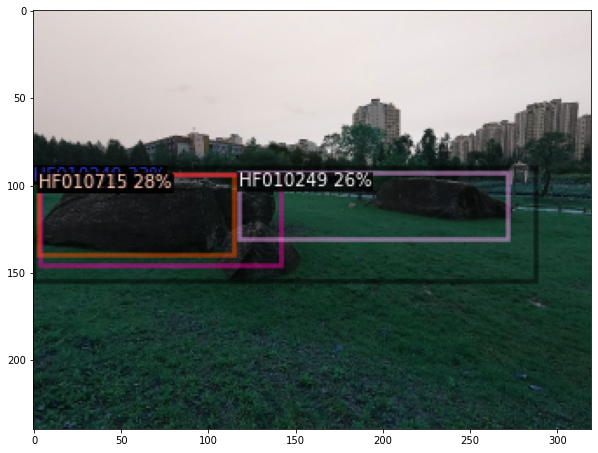

PRED: ['신문왕릉' '전홍유후설총묘']
Score:  tensor([0.8770, 0.2805])
LABEL: 신문왕릉


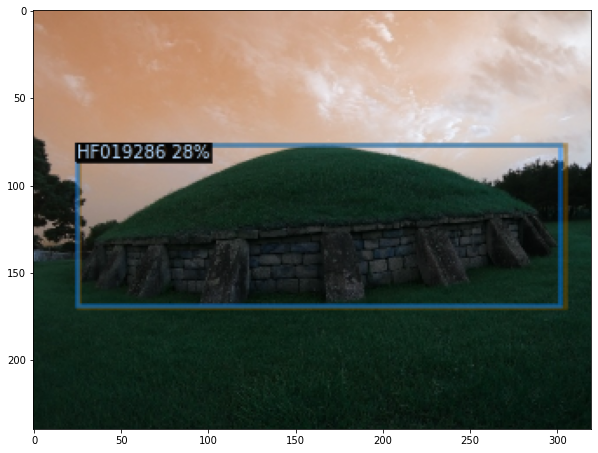

In [13]:
import numpy as np
from PIL import ImageFont, ImageDraw, Image
import cv2

thing_classes = np.load('./dataset/thing_classes.npy', allow_pickle=True)
# img = np.zeros((200,400,3),np.uint8)
# b,g,r,a = 255,255,255,0
# fontpath = "fonts/gulim.ttc"
# font = ImageFont.truetype(fontpath, 20)

for d in random.sample(dataset_dicts, 30):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=aihub_metadata, 
                   scale=0.5, 
                   #instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize=(10,10))
    plt.imshow(out.get_image()[:, :, ::-1])
    #print(outputs["instances"].to("cpu").pred_classes)
    print('PRED:', thing_classes[outputs["instances"].to("cpu").pred_classes])
    print('Score: ', outputs["instances"].to("cpu").scores)
    print('LABEL:',thing_classes[d['annotations'][0]['category_id']])
    plt.show()
    

In [9]:
d['annotations'][0]['category_id']

55

In [ ]:
outputs["instances"].to("cpu").scores

In [ ]:
df = pd.read_csv('dataset/test_dataframe.csv')

In [ ]:
config = OmegaConf.load(df[df['class']=='HF030034'].reset_index(drop=True).loc[0].yaml_path)
print(config['regions'][0]['tags'][5].split(':')[-1])

In [ ]:
aihub_metadata.get('thing_classes')

In [ ]:
outputs["instances"].to("cpu")

In [ ]:
aihub_metadata

In [ ]:
aihub_metadata

In [ ]:
folds = []
for i in range(16):
    train_df = pd.read_csv(f"./utils/train_dataframe_fold{i}.csv")
    folds.append(train_df)

In [ ]:
train_df = pd.concat(folds)

In [ ]:
train_df = train_df.reset_index(drop=True)

In [ ]:
train_df.to_csv('dataset/train_dataframe.csv')

In [ ]:
val_df = pd.read_csv('dataset/val_dataframe.csv')

In [ ]:
trainval_df = pd.concat([train_df, val_df])

In [ ]:
trainval_df = trainval_df.reset_index(drop=True)

In [ ]:
trainval_df.to_csv('dataset/trainval_dataframe.csv')

In [ ]:
test_df = pd.read_csv('dataset/test_dataframe.csv')

In [ ]:
test_labels = set(test_df['class'].unique())
trainval_labels = set(trainval_df['class'].unique())

In [ ]:
test_labels - trainval_labels

In [ ]:
print(len(test_df))
removed_test_df = test_df[test_df['class'] != 'HF010318']
removed_test_df = removed_test_df[removed_test_df['class'] != 'HF010343']
print(len(removed_test_df))

In [ ]:
test_df[test_df['class'] == 'HF010318'].loc[238937].image_path

In [ ]:
attatched = pd.concat([trainval_df, test_df[test_df['class'] == 'HF010318'], test_df[test_df['class'] == 'HF010343']])
                        

In [ ]:
len(attatched)

In [ ]:
len(trainval_df)

In [ ]:
removed_test_df = removed_test_df.reset_index(drop=True)

In [ ]:
removed_test_df[removed_test_df['class'] == 'HF010527'].loc[36183].yaml_path

In [ ]:
from glob import glob
a = glob('/home/ubuntu/workspace_aihub/data/refined/v2/test/HF010527/*.yaml')
len(a)

In [ ]:
len(removed_test_df[removed_test_df['class'] == 'HF010527'].reset_index(drop=True))

In [ ]:
test_typeA = attatched[attatched['class'] == '유적건조물'].reset_index(drop=True)
test_typeB = attatched[attatched['class'] != '유적건조물'].reset_index(drop=True)

In [ ]:

for idx, row in tqdm(test_typeA.iterrows(), total=len(test_typeA)):
    test_typeA.loc[idx, 'class'] = 'HF010527'
    

In [ ]:
final_test = pd.concat([test_typeA, test_typeB]).reset_index(drop=True)

In [ ]:
final_test.to_csv('./dataset/trainval_dataframe.csv')

In [ ]:
np.save('./dataset/trainval_classes.npy', final_test['class'].unique())

In [ ]:
label_names = []
for label in tqdm(final_test['class'].unique()):
    df = final_test[final_test['class'] == label].reset_index(drop=True)
    for data in OmegaConf.load(df.loc[0].yaml_path)['regions'][0]['tags']:
        if 'Instance' in data:
            inst = data.split(':')[-1]
            break
    label_names.append(inst)

In [ ]:
np.array(label_names)

In [ ]:
np.save('./dataset/thing_classes.npy', np.array(label_names))

In [ ]:
!ls ./dataset/